In [1]:
# import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(color_codes = True)
sns.set(style = "ticks")
sns.set_palette("colorblind")
sns.set_context("talk", font_scale=0.85)

# To suppress all warnings
import warnings
warnings.filterwarnings("ignore")

## Import local self-written functions

In [2]:
from correction_functions import (mol_pct, wt_pct, crystal_comp, eq_ol_cpx, crystal_fract_corr)

## Import data

In [3]:
# import data
OIB_df = pd.read_csv('OIB_major+trace_filtered.csv')

# define master list to append corrected data for each island
final_list = []

# showcase df
OIB_df.head()

,Sample ID,Latitude,Longitude,SiO2,TiO2,Al2O3,FeO,MnO,MgO,CaO,...,Sm,Yb,Lu,Hf,Pb,Th,U,Island,Group,Ocean
0,183,-23.874970,-147.685380,44.584149,1.999382,11.388230,12.264248,0.206122,14.974750,11.357312,...,5.78,1.47,0.230,4.020000,2.31,4.51,1.05,Raivavae,Austral-Cook,Pacific
1,190,-23.870000,-147.670000,43.536925,2.657328,11.803481,12.730456,0.195695,12.462664,13.472036,...,6.47,1.35,0.180,3.950000,2.28,4.71,1.01,Raivavae,Austral-Cook,Pacific
2,186,-27.600050,-144.334883,47.266947,2.953543,12.675623,10.634807,0.153830,12.501282,9.875910,...,7.31,1.43,0.200,6.190000,3.32,3.94,1.03,Rapa,Austral-Cook,Pacific
3,188,-27.636111,-144.317778,44.637532,3.084833,11.434447,12.586118,0.164524,14.601542,10.210797,...,6.51,1.17,0.140,5.220000,2.74,3.27,0.81,Rapa,Austral-Cook,Pacific
4,244,-23.390000,-149.470000,43.482280,2.783770,12.367745,13.384694,0.215716,11.566513,12.275295,...,7.32,1.81,0.254,4.884348,2.50,4.08,1.07,Tubuai,Austral-Cook,Pacific


## Separately consider each archipelago and island within that archipelago:
1. Correct for ol or ol+cpx fractionation, using the ol/cpx ratios determined in `ol_cpx_ratio_determination.ipynb`, along with
2. `crystal_fract_corr()`, where the last two arguments define the relative amounts of ol and cpx, respectively (ol should always = 1)

### 1. Hawaii

In [4]:
# define hawaii dataframe
filt = OIB_df[OIB_df['Group']=='Hawaii']

# show value counts
filt['Island'].value_counts()

Island
Niihau     36
Kauai      31
Oahu       20
Maui       17
Hawaii     14
Kaula      12
Molokai     7
Name: count, dtype: int64

In [5]:
# correct islands for fractional crystallization
niihau_df, niihau_melt = crystal_fract_corr(filt[filt['Island']=='Niihau'], 1, 0)
kauai_df, kauai_melt = crystal_fract_corr(filt[filt['Island']=='Kauai'], 1, 0.25)
oahu_df, oahu_melt = crystal_fract_corr(filt[filt['Island']=='Oahu'], 1, 0.5)
maui_df, maui_melt = crystal_fract_corr(filt[filt['Island']=='Maui'], 1, 0.45)
hawaii_df, hawaii_melt = crystal_fract_corr(filt[filt['Island']=='Hawaii'], 1, 0.2)
kaula_df, kaula_melt = crystal_fract_corr(filt[filt['Island']=='Kaula'], 1, 0)
molokai_df, molokai_melt = crystal_fract_corr(filt[filt['Island']=='Molokai'], 1, 0.45)

# combine into a single corrected dataframe
hawaii_df_list = [hawaii_df, oahu_df, niihau_df, maui_df, kauai_df,  molokai_df, kaula_df]
hawaii_group_df = pd.concat(hawaii_df_list, axis=0)

# add corrected df to final_list
final_list.append(hawaii_group_df)

### 2. Iceland

In [6]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Iceland']

# show value counts
filt['Island'].value_counts()

Island
Iceland           12
Vestmannaeyjar     2
Name: count, dtype: int64

In [7]:
# correct islands for fractional crystallization
iceland_df, iceland_melt = crystal_fract_corr(filt[filt['Island']=='Iceland'], 1, 0)
vestmannaeyjar_df, vestmannaeyjar_melt = crystal_fract_corr(filt[filt['Island']=='Vestmannaeyjar'], 1, 0.22)

# combine into a single corrected dataframe
iceland_df_list = [iceland_df, vestmannaeyjar_df]
iceland_group_df = pd.concat(iceland_df_list, axis=0)

# add corrected df to final_list
final_list.append(iceland_group_df)

### 3. Azores

In [8]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Azores']

# show value counts
filt['Island'].value_counts()

Island
Sao Miguel    66
Pico          33
Sao Jorge     29
Terceira      26
Faial         12
Corvo          8
Flores         8
Graciosa       6
Pico Alto      4
Name: count, dtype: int64

In [9]:
# correct islands for fractional crystallization
sao_miguel_df, sao_miguel_melt = crystal_fract_corr(filt[filt['Island']=='Sao Miguel'], 1, 1)
pico_df, pico_melt = crystal_fract_corr(filt[filt['Island']=='Pico'], 1, 0.9)
sao_jorge_df, sao_jorge_melt = crystal_fract_corr(filt[filt['Island']=='Sao Jorge'], 1, 0.9)
terceira_df, terceira_melt = crystal_fract_corr(filt[filt['Island']=='Terceira'], 1, 0.5)
faial_df, faial_melt = crystal_fract_corr(filt[filt['Island']=='Faial'], 1, 0.7)
corvo_df, corvo_melt = crystal_fract_corr(filt[filt['Island']=='Corvo'], 1, 1.25)
flores_df, flores_melt = crystal_fract_corr(filt[filt['Island']=='Flores'], 1, 0.65)
graciosa_df, graciosa_melt = crystal_fract_corr(filt[filt['Island']=='Graciosa'], 1, 0.8)

# combine into a single corrected dataframe
azores_df_list = [sao_miguel_df, pico_df, sao_jorge_df,  terceira_df, graciosa_df,  faial_df, corvo_df, flores_df]
azores_group_df = pd.concat(azores_df_list, axis=0)

# add corrected df to final_list
final_list.append(azores_group_df)

### 4. Mascarene

In [10]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Mascarene']

# show value counts
filt['Island'].value_counts()

Island
Reunion      65
Mauritius    61
Name: count, dtype: int64

In [11]:
# correct islands for fractional crystallization
reunion_df, reunion_melt = crystal_fract_corr(filt[filt['Island']=='Reunion'], 1, 0.12)
mauritius_df, mauritius_melt = crystal_fract_corr(filt[filt['Island']=='Mauritius'], 1, 0.2)

# combine into a single corrected dataframe
mascarene_df_list = [reunion_df, mauritius_df]
mascarene_group_df = pd.concat(mascarene_df_list, axis=0)

# add corrected df to final_list
final_list.append(mascarene_group_df)

### 5. Canary

In [12]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Canary']

# show value counts
filt['Island'].value_counts()

Island
La Palma         127
El Hierro         26
Lanzarote         21
Gran Canaria      15
Tenerife          14
Fuerteventura      7
Name: count, dtype: int64

In [13]:
# correct islands for fractional crystallization
la_palma_df, la_palma_melt = crystal_fract_corr(filt[filt['Island']=='La Palma'], 1, 0.65)
el_hierro_df, el_hierro_melt = crystal_fract_corr(filt[filt['Island']=='El Hierro'], 1, 0.75)
lanzarote_df, lanzarote_melt = crystal_fract_corr(filt[filt['Island']=='Lanzarote'], 1, 0.6)
gran_canaria_df, gran_canaria_melt = crystal_fract_corr(filt[filt['Island']=='Gran Canaria'], 1, 0.7)
tenerife_df, tenerife_melt = crystal_fract_corr(filt[filt['Island']=='Tenerife'], 1, 0.7)
fuerteventura_df, fuerteventura_melt = crystal_fract_corr(filt[filt['Island']=='Fuerteventura'], 1, 0.4)

# combine into a single corrected dataframe
canary_df_list = [la_palma_df, lanzarote_df, el_hierro_df, tenerife_df, gran_canaria_df, fuerteventura_df]
canary_group_df = pd.concat(canary_df_list, axis=0)

# add corrected df to final_list
final_list.append(canary_group_df)

### 6. Galapagos

In [14]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Galapagos']

# show value counts
filt['Island'].value_counts()

Island
San Cristobal    10
Santiago          9
Espanola          4
Isabela           3
Floreana          2
Santa Cruz        1
Name: count, dtype: int64

In [15]:
# correct islands for fractional crystallization
san_cristobal_df, san_cristobal_melt = crystal_fract_corr(filt[filt['Island']=='San Cristobal'], 1, 0)
santiago_df, santiago_melt = crystal_fract_corr(filt[filt['Island']=='Santiago'], 1, 0)
espanola_df, espanola_melt = crystal_fract_corr(filt[filt['Island']=='Espanola'], 1, 0.75)
isabela_df, isabela_melt = crystal_fract_corr(filt[filt['Island']=='Isabela'], 1, 0)
floreana_df, floreana_melt = crystal_fract_corr(filt[filt['Island']=='Floreana'], 1, 0)

# combine into a single corrected dataframe
galapagos_df_list = [santiago_df, isabela_df, san_cristobal_df, espanola_df, floreana_df]
galapagos_group_df = pd.concat(galapagos_df_list, axis=0)

# add corrected df to final_list
final_list.append(galapagos_group_df)

### 7. Austral-Cook

In [16]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Austral-Cook']

# show value counts
filt['Island'].value_counts()

Island
Mangaia      13
Tubuai       10
Rurutu        6
Rarotonga     4
Raivavae      2
Rapa          2
Aitutaki      1
Atiu          1
Name: count, dtype: int64

In [17]:
# correct islands for fractional crystallization
mangaia_df, mangaia_melt = crystal_fract_corr(filt[filt['Island']=='Mangaia'], 1, 1)
tubuai_df, tubuai_melt = crystal_fract_corr(filt[filt['Island']=='Tubuai'], 1, 0.8)
rurutu_df, rurutu_melt = crystal_fract_corr(filt[filt['Island']=='Rurutu'], 1, 0.75)
rarotonga_df, rarotonga_melt = crystal_fract_corr(filt[filt['Island']=='Rarotonga'], 1, 0.7)
raivavae_df, raivavae_melt = crystal_fract_corr(filt[filt['Island']=='Raivavae'], 1, 0.4)
rapa_df, rapa_melt = crystal_fract_corr(filt[filt['Island']=='Rapa'], 1, 0.25)
atiu_df, atiu_melt = crystal_fract_corr(filt[filt['Island']=='Atiu'], 1, 0.4)

# combine into a single corrected dataframe
austral_cook_df_list = [mangaia_df, tubuai_df, rurutu_df, rarotonga_df, raivavae_df, rapa_df, atiu_df]
austral_cook_group_df = pd.concat(austral_cook_df_list, axis=0)

# add corrected df to final_list
final_list.append(austral_cook_group_df)

### 8. Kerguelen

In [18]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Kerguelen']

# show value counts
filt['Island'].value_counts()

Island
Kerguelen    12
Foch          2
Name: count, dtype: int64

In [19]:
# correct islands for fractional crystallization
kerguelen_df, kerguelen_melt = crystal_fract_corr(filt[filt['Island']=='Kerguelen'], 1, 0.3)

# add corrected df to final_list
final_list.append(kerguelen_df)

### 9. Pitcairn

In [20]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Pitcairn']

# show value counts
filt['Island'].value_counts()

Island
Pitcairn    18
Name: count, dtype: int64

In [21]:
# correct islands for fractional crystallization
pitcairn_df, pitcairn_melt = crystal_fract_corr(filt[filt['Island']=='Pitcairn'], 1, 0.15)

# add corrected df to final_list
final_list.append(pitcairn_df)

### 10. Cape Verde

In [22]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Cape Verde']

# show value counts
filt['Island'].value_counts()

Island
Fogo           16
Sao Antao      16
Sao Vicente     8
Sao Nicolao     7
Name: count, dtype: int64

In [23]:
# correct islands for fractional crystallization
fogo_df, fogo_melt = crystal_fract_corr(filt[filt['Island']=='Fogo'], 1, 1)
sao_antao_df, sao_antao_melt = crystal_fract_corr(filt[filt['Island']=='Sao Antao'], 1, 0.3)
sao_vicente_df, sao_vicente_melt = crystal_fract_corr(filt[filt['Island']=='Sao Vicente'], 1, 0.55)
sao_nicolao_df, sao_nicolao_melt = crystal_fract_corr(filt[filt['Island']=='Sao Nicolao'], 1, 0.65)

# combine into a single corrected dataframe
cape_verde_df_list = [sao_antao_df, sao_nicolao_df, fogo_df, sao_vicente_df]
cape_verde_group_df = pd.concat(cape_verde_df_list, axis=0)

# add corrected df to final_list
final_list.append(cape_verde_group_df)

### 11. Tristan da Cunha

In [24]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Tristan Da Cunha']

# show value counts
filt['Island'].value_counts()

Island
Tristan Da Cunha    13
Name: count, dtype: int64

In [25]:
# correct islands for fractional crystallization
tristan_da_cunha_df, tristan_da_cunha_melt = crystal_fract_corr(filt[filt['Island']=='Tristan Da Cunha'], 1, 0.6)

# add corrected df to final_list
final_list.append(tristan_da_cunha_df)

### 12. Caroline

In [26]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Caroline']

# show value counts
filt['Island'].value_counts()

Island
Ponape              19
Desertas Islands    16
Chuuk                4
Kosrae               2
Porto Santo          1
Name: count, dtype: int64

In [27]:
# correct islands for fractional crystallization
ponape_df, ponape_melt = crystal_fract_corr(filt[filt['Island']=='Ponape'], 1, 0.7)
chuuk_df, chuuk_melt = crystal_fract_corr(filt[filt['Island']=='Chuuk'], 1, 0.75)

# combine into a single corrected dataframe
caroline_df_list = [ponape_df, chuuk_df]
caroline_group_df = pd.concat(caroline_df_list, axis=0)

# add corrected df to final_list
final_list.append(caroline_group_df)

### 13. Marquesas

In [28]:
# define hawaii dataframe
filt = OIB_df[OIB_df['Group']=='Marquesas']

# show value counts
filt['Island'].value_counts()

Island
Ua Huka      6
Fatu Hiva    4
Tahuata      3
Motane       2
Hiva Oa      2
Nuku Hiva    2
Ua Pou       1
Name: count, dtype: int64

In [29]:
# correct islands for fractional crystallization
ua_huka_df, ua_huka_melt = crystal_fract_corr(filt[filt['Island']=='Ua Huka'], 1, 0.7)
fatu_hiva_df, fatu_hiva_melt = crystal_fract_corr(filt[filt['Island']=='Fatu Hiva'], 1, 0)
tahuata_df, tahuata_melt = crystal_fract_corr(filt[filt['Island']=='Tahuata'], 1, 0.5)
hiva_oa_df, hiva_oa_melt = crystal_fract_corr(filt[filt['Island']=='Hiva Oa'], 1, 0.2)
nuku_hiva_df, nuku_hiva_melt = crystal_fract_corr(filt[filt['Island']=='Nuku Hiva'], 1, 0)
ua_pou_df, ua_pou_melt = crystal_fract_corr(filt[filt['Island']=='Ua Pou'], 1, 0)

# omit Ua Huka because they do not have enough sample to determine slope

# combine into a single corrected dataframe
marquesas_df_list = [ua_huka_df, fatu_hiva_df, nuku_hiva_df, ua_pou_df, hiva_oa_df, tahuata_df]
marquesas_group_df = pd.concat(marquesas_df_list, axis=0)

# add corrected df to final_list
final_list.append(marquesas_group_df)

### 14. Gough

In [30]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Gough']

# show value counts
filt['Island'].value_counts()

Island
Gough    22
Name: count, dtype: int64

In [31]:
# correct islands for fractional crystallization
gough_df, gough_melt = crystal_fract_corr(filt[filt['Island']=='Gough'], 1, 0.5)

# add corrected df to final_list
final_list.append(gough_df)

### 15. Juan Fernandez

In [32]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Juan Fernandez']

# show value counts
filt['Island'].value_counts()

Island
Alexander Selkirk    6
Robinson Crusoe      3
Name: count, dtype: int64

In [33]:
# correct islands for fractional crystallization
alexander_selkirk_df, alexander_selkirk_melt = crystal_fract_corr(filt[filt['Island']=='Alexander Selkirk'], 1, 0)
robinson_crusoe_df, robinson_crusoe_melt = crystal_fract_corr(filt[filt['Island']=='Robinson Crusoe'], 1, 0.3)

# combine into a single corrected dataframe
juan_fernandez_df_list = [alexander_selkirk_df, robinson_crusoe_df]
juan_fernandez_group_df = pd.concat(juan_fernandez_df_list, axis=0)

# add corrected df to final_list
final_list.append(juan_fernandez_group_df)

### 16. Crozet

In [34]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Crozet']

# show value counts
filt['Island'].value_counts()

Island
Ile De L'Est    11
Name: count, dtype: int64

In [35]:
# correct islands for fractional crystallization
ile_de_lest_df, ile_de_lest_melt = crystal_fract_corr(filt[filt['Island']=="Ile De L'Est"], 1, 0.4)

# add corrected df to final_list
final_list.append(ile_de_lest_df)

### 17. St. Helena

In [36]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='St. Helena']

# show value counts
filt['Island'].value_counts()

Island
St. Helena    19
Name: count, dtype: int64

In [37]:
# correct islands for fractional crystallization
st_helena_df, st_helena_melt = crystal_fract_corr(filt[filt['Island']=='St. Helena'], 1, 0.75)

# add corrected df to final_list
final_list.append(st_helena_df)

### 18. Society

In [38]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Society']

# show value counts
filt['Island'].value_counts()

Island
Tahaa      1
Maupiti    1
Mehetia    1
Name: count, dtype: int64

In [39]:
# correct islands for fractional crystallization
tahaa_df, tahaa_melt = crystal_fract_corr(filt[filt['Island']=='Tahaa'], 1, 0)
maupiti_df, maupiti_melt = crystal_fract_corr(filt[filt['Island']=='Maupiti'], 1, 0)
mehetia_df, mehetia_melt = crystal_fract_corr(filt[filt['Island']=='Mehetia'], 1, 0.5)

# combine into a single corrected dataframe
society_df_list = [mehetia_df, tahaa_df, maupiti_df]
society_group_df = pd.concat(society_df_list, axis=0)

# add corrected df to final_list
final_list.append(society_group_df)

### 19. Samoa

In [40]:
# define dataframe
filt = OIB_df[OIB_df['Group']=='Samoa']

# show value counts
filt['Island'].value_counts()

Island
Tutuila          31
Savai^I          23
Manua Islands    19
Upolu            15
Name: count, dtype: int64

In [41]:
# correct islands for fractional crystallization
tutuila_df, tutuila_melt = crystal_fract_corr(filt[filt['Island']=='Tutuila'], 1, 0.55)
savai_df, savai_melt = crystal_fract_corr(filt[filt['Island']=='Savai^I'], 1, 0.6)
manua_df, manua_melt = crystal_fract_corr(filt[filt['Island']=='Manua Islands'], 1, 0.2)
upolu_df, upolu_melt = crystal_fract_corr(filt[filt['Island']=='Upolu'], 1, 0.35)

# combine into a single corrected dataframe
samoa_df_list = [tutuila_df, manua_df, savai_df, upolu_df]
samoa_group_df = pd.concat(samoa_df_list, axis=0)

# add corrected df to final_list
final_list.append(samoa_group_df)

## Combine all corrected dataframes into a single dataframe

In [42]:
# concat all dfs together
corrected_df = pd.concat(final_list, axis=0)

# view value counts for each island group
corrected_df['Group'].value_counts()

Group
Canary              210
Azores              188
Hawaii              137
Mascarene           126
Samoa                88
Cape Verde           47
Austral-Cook         38
Galapagos            28
Caroline             23
Gough                22
St. Helena           19
Pitcairn             18
Marquesas            18
Iceland              14
Tristan Da Cunha     13
Kerguelen            12
Crozet               11
Juan Fernandez        9
Society               3
Name: count, dtype: int64

### Export data

In [43]:
# filter extreme outliers after manual inspection
corrected_df = corrected_df[(corrected_df['TiO2'] < 4.5) &
                            (corrected_df['FeO'] < 15) &
                            (corrected_df['MnO'] < 0.2) &
                            (corrected_df['CaO'] < 14) &
                            (corrected_df['P2O5'] < 1) &
                            (corrected_df['Rb'] < 60) &
                            (corrected_df['Zr'] < 350) &
                            (corrected_df['Nb'] < 90) &
                            (corrected_df['La'] < 75) &
                            (corrected_df['Ce'] < 150) &
                            (corrected_df['Nd'] < 65) &
                            (corrected_df['Sm'] < 12.5) &
                            (corrected_df['Yb'] < 2.6) &
                            (corrected_df['Lu'] < 0.4) &
                            (corrected_df['Hf'] < 8) &
                            (corrected_df['Pb'] < 6) &
                            (corrected_df['Th'] < 9) &
                            (corrected_df['U'] < 2.2)]

# check updated value counts
corrected_df['Group'].value_counts()

Group
Canary              201
Azores              186
Hawaii              129
Mascarene           126
Samoa                86
Cape Verde           41
Austral-Cook         33
Galapagos            27
Caroline             23
Gough                22
St. Helena           19
Pitcairn             18
Marquesas            17
Tristan Da Cunha     13
Kerguelen            12
Iceland              11
Crozet               11
Juan Fernandez        9
Society               3
Name: count, dtype: int64

In [44]:
corrected_df.to_csv('Ol+cpx_fractionation_correction_output.csv', index=False)

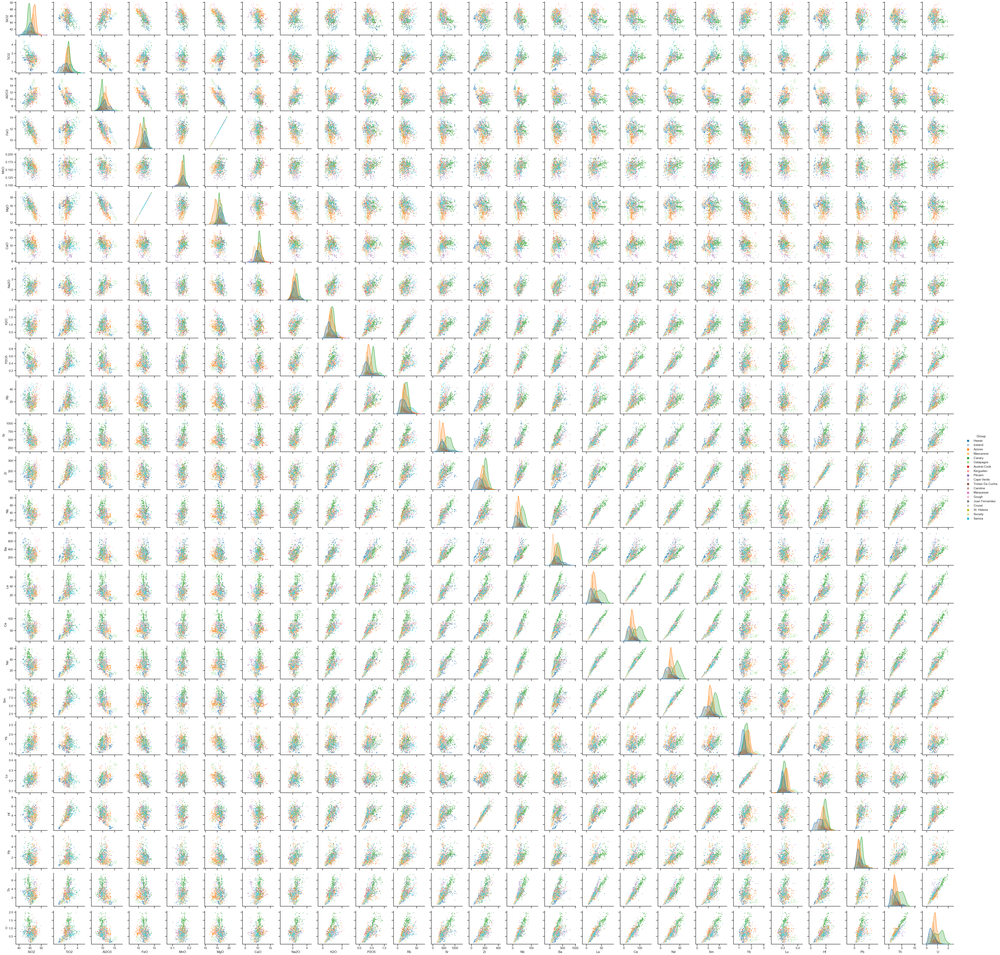

In [45]:
# examine corrected data
sns.pairplot(corrected_df.drop(columns=['Ocean','Sample ID', 'Latitude', 'Longitude', 'ol added (%)', 'cpx added (%)']), hue='Group', palette='tab20', plot_kws={'s': 8})
plt.show()